In [1]:
import cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import os
import csv
import json
import torch
import torchvision
from torch.autograd import Variable
import torch.nn as nn
import torch.nn.functional as F
import shutil
import time as time

In [2]:
## paths
train1_txt_path = '../data/train/files/train1.txt'
train1_csv_path = '../data/train/files/train1.csv'
train1_img_path = '../data/train/imgs/'
train1_mp4_path = '../data/train/videos/train1.mp4'
model_save_path = '../data/models/opflw.pkl'



test_img_path = '../data/test/imgs/'
test_csv_path = '../data/test/files/driving.csv'




In [3]:
## hyper-parameters
num_trn_epochs = 15
num_batch_size = 32
learning_rate = 0.0001


In [4]:
with open(train1_txt_path) as train_speed_file:
    speed_ground=train_speed_file.readlines()
print(len(speed_ground))

20400


In [5]:
train_df = pd.read_csv(train1_csv_path)
train_df.head(5)
#len(train_df)

,image_path,frame,speed
0,../data/train/imgs/0.jpg,0,28.105569
1,../data/train/imgs/1.jpg,1,28.105569
2,../data/train/imgs/2.jpg,2,28.106527
3,../data/train/imgs/3.jpg,3,28.130404
4,../data/train/imgs/4.jpg,4,28.109243


In [6]:
## test data
test_df = pd.read_csv(test_csv_path)
test_df.head(5)

,image_path,frame,speed
0,../data/test/imgs/0.jpg,0,2.022715
1,../data/test/imgs/1.jpg,1,2.040872
2,../data/test/imgs/2.jpg,2,2.062394
3,../data/test/imgs/3.jpg,3,2.076283
4,../data/test/imgs/4.jpg,4,2.077074


In [7]:
# load sub-set of images for code debug purposes  ****** DEBUG ONLY ******** COMM
#train_df=train_df.head(322) #161


In [8]:
# VIDEO TO (IMAGES AND CSV FILE)
# only if images have not been extracted then this code block gets executed to generate jpgs from mp4
# make sure that 'train1_img_path' has no jpgs if running for first time 

def write_image_to_disk(idx, cap, writer, item):
    
    cap.set(cv2.CAP_PROP_POS_FRAMES, idx)
    
    #read in the image
    success, image = cap.read()
    print success

    if success:
        image_path = os.path.join(train1_img_path, str(idx) + '.jpg')

        #save image to IMG folder
        cv2.imwrite(image_path, image)

        #write row to train1.csv
        writer.writerow({'image_path': image_path,
                  'frame': idx,
                  'speed':float(item),
                 })
        





In [9]:
last_count = 0
if not any(fname.endswith('.jpg') for fname in os.listdir(train1_img_path)):

    with open(train1_csv_path, 'w') as csvfile:
         fieldnames = ['image_path', 'frame', 'speed']
         writer = csv.DictWriter(csvfile, fieldnames = fieldnames)
         writer.writeheader()

         #Path to raw image folder
         abs_path_to_IMG = os.path.join(train1_img_path)

         cap = cv2.VideoCapture(train1_mp4_path)
         cap.set(cv2.CAP_PROP_FRAME_COUNT, len(speed_ground))

         for idx, item in enumerate(speed_ground):
            
            if idx % 100 == 0:
                print idx , 'images extracted .... '
            
            write_image_to_disk(idx, cap, writer, item)
        
         last_count = idx
         
                
            
print('images extracted..')

images extracted..


In [10]:
## take care of regenerating the last image 1 more time to fix the pairs of image count

if last_count != 0 and idx%2 != 0 :
    idx +=1
    print idx
    shutil.copyfile(train1_img_path+ str(idx-1) + '.jpg', train1_img_path + str(idx) + '.jpg')

In [11]:
def brightness_augmentation(img,brightness_factor):
    hsv_image = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
#     print hsv_image.shape
    hsv_image[:,:,2] = hsv_image[:,:,2]*brightness_factor
    img = np.array(hsv_image, dtype = np.uint8)
    img = cv2.cvtColor(img, cv2.COLOR_HSV2RGB)
    return img

In [12]:
from sklearn.model_selection import train_test_split

def batch_shuffle(dframe):
    dframe_for_split=dframe[:-1]
    train_data = []
    validation_data = []
    
    train,validation=train_test_split(dframe_for_split, shuffle=True, test_size=0.2)
    print("--------------------------------")
    print("train length ", len(train))
    print("validation length ", len(validation))
    print('===================================')
    print("training data ", train)
    print('===================================')
    print("validation data ", validation)
    
    for idx,row in train.iterrows():
        
        random_pairs = train.sample(n=2)
        print(random_pairs)
        print(random_pairs['frame'])
        idx1 = random_pairs['frame'].iloc[0]
        idx2 = random_pairs['frame'].iloc[1]
        '''
        idx1=row['frame']
        print("idx1 ", idx1)
        idx2=idx1+1
        #idx2 = np.random.randint(low=1, high=len(train) - 1)
        
        print("idx2 ", idx2)
        print("idx of train ... ",idx1)
        '''
        train_data.append((idx1,idx2))
        
        
    print('VAL STARTS ===================================')
        
    for _,row in validation.iterrows():
        #idx1=row['frame']
        #idx2=idx1+1
        random_pairs = validation.sample(n=2)
        print(random_pairs)
        print(random_pairs['frame'])
        idx1 = random_pairs['frame'].iloc[0]
        idx2 = random_pairs['frame'].iloc[1]
        
        validation_data.append((idx1,idx2))
        
    return train_data, validation_data

In [13]:
x,y = batch_shuffle(train_df)
print "train_pairs"
print len(x)
print x
print ""
print "validation_pairs"
print len(y)
print y

--------------------------------
('train length ', 16319)
('validation length ', 4080)
('training data ',                          image_path  frame      speed
3838    ../data/train/imgs/3838.jpg   3838  21.496236
9033    ../data/train/imgs/9033.jpg   9033   9.164614
19114  ../data/train/imgs/19114.jpg  19114  10.930804
5251    ../data/train/imgs/5251.jpg   5251  23.055101
10578  ../data/train/imgs/10578.jpg  10578   3.674916
16451  ../data/train/imgs/16451.jpg  16451   2.615442
13206  ../data/train/imgs/13206.jpg  13206   7.565967
9911    ../data/train/imgs/9911.jpg   9911   8.066318
15198  ../data/train/imgs/15198.jpg  15198  12.461613
13610  ../data/train/imgs/13610.jpg  13610   2.809281
8502    ../data/train/imgs/8502.jpg   8502  15.895458
16404  ../data/train/imgs/16404.jpg  16404   4.208315
10332  ../data/train/imgs/10332.jpg  10332   6.399739
7068    ../data/train/imgs/7068.jpg   7068  18.132128
11363  ../data/train/imgs/11363.jpg  11363   4.341916
12771  ../data/train/imgs/1277

In [14]:

x,y = batch_shuffle(train_df)
print "train_pairs"
print len(x)
print ""
print "validation_pairs"
print len(y)

--------------------------------
('train length ', 16319)
('validation length ', 4080)
('training data ',                          image_path  frame      speed
13040  ../data/train/imgs/13040.jpg  13040   6.418534
14340  ../data/train/imgs/14340.jpg  14340   4.987138
11801  ../data/train/imgs/11801.jpg  11801   7.966971
3600    ../data/train/imgs/3600.jpg   3600  21.710534
18703  ../data/train/imgs/18703.jpg  18703   0.000000
12341  ../data/train/imgs/12341.jpg  12341   7.862226
18701  ../data/train/imgs/18701.jpg  18701   0.000000
14531  ../data/train/imgs/14531.jpg  14531   0.000000
1034    ../data/train/imgs/1034.jpg   1034  19.202560
11133  ../data/train/imgs/11133.jpg  11133   4.647444
18222  ../data/train/imgs/18222.jpg  18222   5.209769
18146  ../data/train/imgs/18146.jpg  18146   2.036735
1237    ../data/train/imgs/1237.jpg   1237  15.851093
247      ../data/train/imgs/247.jpg    247  21.878563
3726    ../data/train/imgs/3726.jpg   3726  21.943072
3052    ../data/train/imgs/305

In [15]:
def preprocessing(image_path, brightness_factor=None):
    img=cv2.imread(image_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)#
    if brightness_factor:
        img = brightness_augmentation(img, brightness_factor)
    img = cv2.resize(img[100:440, :-90], (220, 66), interpolation = cv2.INTER_AREA)
    return img

In [16]:
def computeOpticalFlow(img1,img2):  #Dense Optical Flow
    
    gray1=cv2.cvtColor(img1,cv2.COLOR_RGB2GRAY)
    gray2=cv2.cvtColor(img2,cv2.COLOR_RGB2GRAY)
    
#     plt.imshow(gray1)
#     plt.show()
#     plt.imshow(gray2)
#     plt.show()
    
    hsv = np.zeros_like(img1)
    hsv[...,1] = 255
    
    # 2-channel array with optical flow vectors
    flow = cv2.calcOpticalFlowFarneback(gray1, gray2, flow=None, pyr_scale=0.5, 
                                        levels=3, winsize=15, iterations=3, 
                                        poly_n=5, poly_sigma=1.2, flags=0)
    
    # find their magnitude and direction
    mag, ang = cv2.cartToPolar(flow[...,0], flow[...,1])
    
    # color code the result for better visualization. 
    
    # Direction corresponds to Hue value of the image.
    hsv[...,0] = ang*180/np.pi/2
    
    # Magnitude corresponds to Value plane. 
    hsv[...,2] = cv2.normalize(mag,None,0,255,cv2.NORM_MINMAX)
    
    rgb = cv2.cvtColor(hsv,cv2.COLOR_HSV2BGR)
#     plt.imshow(rgb)
#     plt.show()
    
    return rgb

    
# img1=preprocessing('../data/IMG/0.jpg')
# img2=preprocessing('../data/IMG/1.jpg')
# computeOpticalFlow(img1,img2)

In [17]:
import copy
def generate_training_data(tuples, data, batch_size=num_batch_size):
    channels=3
    image_batch = np.zeros((batch_size, 66, 220, 3)) # nvidia input params
    label_batch = np.zeros((batch_size))
    batch_data = []
    batch_labels = []
    
    for j in range(len(tuples) * 2 /batch_size): #*2
        for i in range(0,batch_size,2): #,2
            
            print("------------------------------ ")
            idx = np.random.randint(1, len(tuples) - 1)
            print("idx > ", idx)
            brightness_factor=0.2 + np.random.uniform()

            row1=data.iloc[[tuples[idx][0]]] #idx
            row2=data.iloc[[tuples[idx][1]]] #idx
            
            print("row1 >> ", row1)
            print("row2 >> ", row2)
            
            print("tuples[idx] >> ",tuples[idx])
            print("tuples[idx][0] >> ",tuples[idx][0])
            print("tuples[idx][1] >> ",tuples[idx][1])
            #print(row1['image_path'])
            img1 = preprocessing(row1['image_path'].values[0],brightness_factor)
            img2 = preprocessing(row2['image_path'].values[0],brightness_factor)
            #print row1['image_path']
            #print row2['image_path']
            
            speed1 = row1['speed'].values[0]
            speed2 = row2['speed'].values[0]

            resimg = computeOpticalFlow(img1,img2)
            speed = np.mean([speed1, speed2])
            
            image_batch[i] = resimg
            label_batch[i] = speed
            
            # flip the same image and save with same label
            
            ## flipping the image pair
            aug_img1 = np.flip(img1, 1)
            aug_img2 = np.flip(img2, 1)
            aug_resimg = computeOpticalFlow(aug_img1,aug_img2)

            image_batch[i+1] = aug_resimg
            label_batch[i+1] = speed # speed remains the same
            
        img_batch=image_batch
        img_batch = np.reshape(img_batch, (batch_size, channels, 66, 220))
        
        
            
        batch_data.append(copy.deepcopy(torch.from_numpy(img_batch)))
        batch_labels.append(copy.deepcopy(torch.DoubleTensor(label_batch)))
    
    return zip(batch_data, batch_labels)

batch_size=num_batch_size

trainloader=list(generate_training_data(x,train_df))
train_num = len(trainloader)
print("Finish loading %d minibatches(=%d) of training samples." % (train_num, batch_size))

------------------------------ 
('idx > ', 5017)
('row1 >> ',                        image_path  frame      speed
1753  ../data/train/imgs/1753.jpg   1753  19.264967)
('row2 >> ',                        image_path  frame     speed
9645  ../data/train/imgs/9645.jpg   9645  8.462031)
('tuples[idx] >> ', (1753, 9645))
('tuples[idx][0] >> ', 1753)
('tuples[idx][1] >> ', 9645)
------------------------------ 
('idx > ', 3424)
('row1 >> ',                        image_path  frame      speed
1252  ../data/train/imgs/1252.jpg   1252  15.561526)
('row2 >> ',                          image_path  frame     speed
14710  ../data/train/imgs/14710.jpg  14710  1.004072)
('tuples[idx] >> ', (1252, 14710))
('tuples[idx][0] >> ', 1252)
('tuples[idx][1] >> ', 14710)
------------------------------ 
('idx > ', 11182)
('row1 >> ',                          image_path  frame     speed
14676  ../data/train/imgs/14676.jpg  14676  0.378736)
('row2 >> ',                        image_path  frame      speed
8100  ../

In [18]:
def generate_validation_data(tuples,data,batch_size=num_batch_size):
    channels=3
    val_image_batch = np.zeros((batch_size, 66, 220, 3)) # nvidia input params
    val_label_batch = np.zeros((batch_size))
    batch_data_val = []
    batch_labels_val = []
    output = list()
    
    for j in range(len(tuples)/batch_size):
        for i in range(0,batch_size):
            idx = np.random.randint(1, len(tuples) - 1)
            
            brightness_factor=0.2 + np.random.uniform()
            
            row1=data.iloc[[tuples[idx][0]]] #idx
            row2=data.iloc[[tuples[idx][1]]] #idx

            img1 = preprocessing(row1['image_path'].values[0],brightness_factor)
            img2 = preprocessing(row2['image_path'].values[0],brightness_factor)
            
            #print row1['image_path']
            #print row2['image_path']
            speed1 = row1['speed'].values[0]
            speed2 = row2['speed'].values[0]
            
            #print speed1
            #print speed2

            resimg = computeOpticalFlow(img1,img2)
            #resimg = resimg.reshape(1, resimg.shape[0], resimg.shape[1], resimg.shape[2])
            
            
            speed = np.mean([speed1, speed2])
            #speed = np.array([[speed]])
            #print "speed ", speed
            
            val_image_batch[i] = resimg
            val_label_batch[i] = speed
            
            #print i
            #print "resimg ", resimg
            #print "val_image_batch[i] >>>>> ",val_image_batch[i]
            #print val_label_batch[i]
            #print "*****************************"
            
        
        val_img_batch=val_image_batch
        val_img_batch = np.reshape(val_img_batch, (batch_size, channels, 66, 220))
        #print "val_img_batch" ,val_img_batch
        
        batch_data_val.append(copy.deepcopy(torch.from_numpy(val_img_batch)))
        batch_labels_val.append(copy.deepcopy(torch.DoubleTensor(val_label_batch)))
        
    return zip(batch_data_val, batch_labels_val)

batch_size=num_batch_size

validatnloader=list(generate_validation_data(y,train_df))
validation_num = len(validatnloader)
print("Finish loading %d minibatches(=%d) of validation samples." % (validation_num, batch_size))
#print "validatnloader >> ",validatnloader

Finish loading 127 minibatches(=32) of validation samples.


In [19]:
import torch.optim as optim

img_size=(66,220,3)

class NvidiaNet(nn.Module):
    def __init__(self):
        super(NvidiaNet, self).__init__()
        self.conv1 = nn.Conv2d(3, 24, kernel_size=5,stride=2)
        self.conv2 = nn.Conv2d(24, 36, kernel_size=5,stride=2)
        self.conv3 = nn.Conv2d(36, 48, kernel_size=5,stride=2)
        self.conv3_drop = nn.Dropout2d()
        self.conv4 = nn.Conv2d(48, 64, kernel_size=3,stride=1)
        self.conv5 = nn.Conv2d(64, 64, kernel_size=3,stride=1)
        self.fc1 = nn.Linear(1280, 1164)
        self.fc2 = nn.Linear(1164, 100)
        self.fc3 = nn.Linear(100, 50)
        self.fc4 = nn.Linear(50, 10)
        self.fc5 = nn.Linear(10, 1)
        
    def forward(self, x):
        x = F.elu(self.conv1(x))
        x = F.elu(self.conv2(x))
        x = self.conv3_drop(F.elu(self.conv3(x)))
        x = F.elu(self.conv4(x))
        x = F.elu(self.conv5(x))
        x = x.view(-1, 1280)
        x = F.elu(self.fc1(x))
        x = F.elu(self.fc2(x))
        x = F.elu(self.fc3(x))
        x = F.elu(self.fc4(x))
        x = self.fc5(x)
        return x
    
    
net = NvidiaNet()
net = net.double()

criterion = nn.MSELoss()
optimizer = optim.Adam(net.parameters(), lr=learning_rate)



In [20]:
### Training starts
train_start_time = time.time()
net.train()
trn_losses = list()
for epoch in range(num_trn_epochs):  # loop over the dataset multiple times
    print epoch
    running_loss = 0.0
    for i, data in enumerate(trainloader, 0):
        inputs, labels = data
        optimizer.zero_grad()
        outputs = net(inputs)
        
        labels=labels.view(-1,1)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        
        running_loss += loss.item()
        trn_losses.append(loss.item())
        if (i+1) % 10 == 0:    # print every 2000 steps
            print('[%d, %5d] loss: %.3f' %
              (epoch + 1, i + 1, running_loss / 2000))
        running_loss = 0.0

#save the model
torch.save(net, model_save_path)
print('Finished Training .. saved model ',model_save_path)

train_end_time = time.time() - train_start_time
print('------------------------------------------------------------')
print("time taken to TRAIN for DenseOpticalFlow  in seconds {:.3f}".format(train_end_time))


0
[1,    10] loss: 0.096
[1,    20] loss: 0.027
[1,    30] loss: 0.025
[1,    40] loss: 0.024
[1,    50] loss: 0.017
[1,    60] loss: 0.034
[1,    70] loss: 0.007
[1,    80] loss: 0.020
[1,    90] loss: 0.017
[1,   100] loss: 0.024
[1,   110] loss: 0.029
[1,   120] loss: 0.018
[1,   130] loss: 0.019
[1,   140] loss: 0.019
[1,   150] loss: 0.025
[1,   160] loss: 0.013
[1,   170] loss: 0.018
[1,   180] loss: 0.015
[1,   190] loss: 0.012
[1,   200] loss: 0.015
[1,   210] loss: 0.015
[1,   220] loss: 0.023
[1,   230] loss: 0.016
[1,   240] loss: 0.020
[1,   250] loss: 0.011
[1,   260] loss: 0.018
[1,   270] loss: 0.019
[1,   280] loss: 0.013
[1,   290] loss: 0.021
[1,   300] loss: 0.010
[1,   310] loss: 0.024
[1,   320] loss: 0.016
[1,   330] loss: 0.010
[1,   340] loss: 0.014
[1,   350] loss: 0.020
[1,   360] loss: 0.011
[1,   370] loss: 0.014
[1,   380] loss: 0.016
[1,   390] loss: 0.011
[1,   400] loss: 0.011
[1,   410] loss: 0.021
[1,   420] loss: 0.008
[1,   430] loss: 0.027
[1,   440

/home/shayan_ray/anaconda2/lib/python2.7/site-packages/torch/serialization.py:241: UserWarning: Couldn't retrieve source code for container of type NvidiaNet. It won't be checked for correctness upon loading.
  "type " + obj.__name__ + ". It won't be checked "


In [21]:
# load the model
net_val = torch.load(model_save_path)
net_val.eval()
#net.eval()

NvidiaNet(
  (conv1): Conv2d(3, 24, kernel_size=(5, 5), stride=(2, 2))
  (conv2): Conv2d(24, 36, kernel_size=(5, 5), stride=(2, 2))
  (conv3): Conv2d(36, 48, kernel_size=(5, 5), stride=(2, 2))
  (conv3_drop): Dropout2d(p=0.5)
  (conv4): Conv2d(48, 64, kernel_size=(3, 3), stride=(1, 1))
  (conv5): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1))
  (fc1): Linear(in_features=1280, out_features=1164, bias=True)
  (fc2): Linear(in_features=1164, out_features=100, bias=True)
  (fc3): Linear(in_features=100, out_features=50, bias=True)
  (fc4): Linear(in_features=50, out_features=10, bias=True)
  (fc5): Linear(in_features=10, out_features=1, bias=True)
)

In [22]:
#x,y = batch_shuffle(train_df)
#print "train_pairs"
#print train_num * batch_size
#print ""
#print "validation_pairs"
#print len(y)

In [23]:
### Validation starts
val_start_time = time.time()
running_val_loss = 0.0
val_losses = list()
for i, dataval in enumerate(validatnloader, 0):
    #print dataval
    inputs, labels = dataval
    #print i
    #print "inputs >> ", inputs
    outputs = net_val(inputs)
    labels=labels.view(-1,1)
    #print "outputs ", outputs
    #print "labels ", labels
    val_loss = criterion(outputs, labels)
    print "val_loss ", val_loss
    running_val_loss += val_loss.item()
    val_losses.append(val_loss.item())
    if (i+1) % 2 == 0:    # print every 10 steps
        print('[%d, %5d] loss: %.3f' %
          (epoch + 1, i + 1, running_val_loss / 2000))
    running_val_loss = 0.0
          
print('Validation done')
val_end_time = time.time() - val_start_time
print('------------------------------------------------------------')
print("time taken to VALIDATE for DenseOpticalFlow  in seconds {:.3f}".format(val_end_time))


val_loss  tensor(18.7617, dtype=torch.float64, grad_fn=<MseLossBackward>)
val_loss  tensor(14.1760, dtype=torch.float64, grad_fn=<MseLossBackward>)
[15,     2] loss: 0.007
val_loss  tensor(14.3009, dtype=torch.float64, grad_fn=<MseLossBackward>)
val_loss  tensor(22.3650, dtype=torch.float64, grad_fn=<MseLossBackward>)
[15,     4] loss: 0.011
val_loss  tensor(13.2059, dtype=torch.float64, grad_fn=<MseLossBackward>)
val_loss  tensor(15.7343, dtype=torch.float64, grad_fn=<MseLossBackward>)
[15,     6] loss: 0.008
val_loss  tensor(15.1803, dtype=torch.float64, grad_fn=<MseLossBackward>)
val_loss  tensor(17.8138, dtype=torch.float64, grad_fn=<MseLossBackward>)
[15,     8] loss: 0.009
val_loss  tensor(14.5340, dtype=torch.float64, grad_fn=<MseLossBackward>)
val_loss  tensor(13.8865, dtype=torch.float64, grad_fn=<MseLossBackward>)
[15,    10] loss: 0.007
val_loss  tensor(18.4106, dtype=torch.float64, grad_fn=<MseLossBackward>)
val_loss  tensor(25.5397, dtype=torch.float64, grad_fn=<MseLossBac

In [24]:
# print "training loss "
# print np.mean(trn_losses)
# print "----------------------------------------------------------------------"

# #print "validation loss"
# #print np.mean(val_losses)

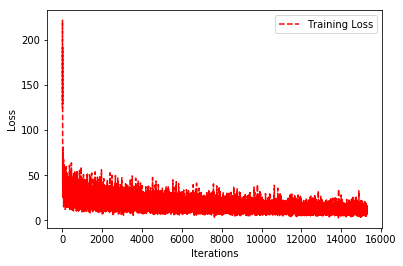

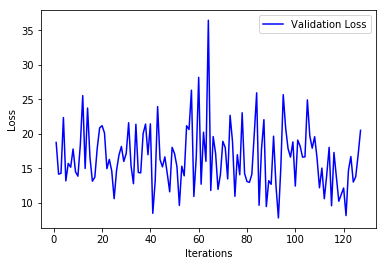

validation loss
16.5869582444


In [25]:
# Get training and validation loss histories

# Create count of the number of epochs
epoch_count = range(1, len(trn_losses) + 1)

# Visualize loss history
plt.plot(epoch_count, trn_losses, 'r--')

plt.legend(['Training Loss'])
plt.xlabel('Iterations')
plt.ylabel('Loss')
plt.show();

epoch_count = range(1, len(val_losses) + 1)

# Visualize loss history
plt.plot(epoch_count, val_losses, 'b-')

plt.legend(['Validation Loss'])
plt.xlabel('Iterations')
plt.ylabel('Loss')
plt.show();


print "validation loss"
print np.mean(val_losses)

In [26]:
# model save
# run validation accuracy
# train validation graph
# sparse optical flow
# images code made to run without commenting 
# last image regenerated to account for the pairs and last batch success


In [27]:
print "training loss"
print np.mean(trn_losses)

training loss
16.8406274219


In [28]:
net_val.eval()
#### TESTING STARTS ###############

net_val.eval()
def generate_test_data(data,batch_size):
    channels=3
    image_batch = np.zeros((batch_size, 66, 220, 3)) # nvidia input params
    label_batch = np.zeros((batch_size))
    batch_data = []
    batch_labels = []

    for j in range(len(data)//batch_size):
        for i in range(batch_size):
            if (i+j*batch_size)+1 == len(data):
                break
            row1=data.iloc[[i+j*batch_size]]
            row2=data.iloc[[(i+j*batch_size)+1]]
            
            img1 = preprocessing(row1['image_path'].values[0])
            img2 = preprocessing(row2['image_path'].values[0])

            speed1 = row1['speed'].values[0]
            speed2 = row2['speed'].values[0]

            resimg = computeOpticalFlow(img1,img2)
            resimg = resimg.reshape(1, resimg.shape[0], resimg.shape[1], resimg.shape[2])
            
            speed = np.mean([speed1, speed2])
            speed = np.array([[speed]])
            
            image_batch[i] = resimg
            label_batch[i] = speed
        
        img_batch=image_batch
        img_batch = np.reshape(img_batch, (batch_size, channels, 66, 220))
        
        batch_data.append(torch.from_numpy(img_batch))
        batch_labels.append(torch.DoubleTensor(label_batch))
        
    return zip(batch_data, batch_labels)

batch_size=32

testloader=list(generate_test_data(test_df,batch_size))
test_num = len(testloader)
print("Finish loading %d minibatches(=%d) of validation samples." % (test_num, batch_size))


Finish loading 269 minibatches(=32) of test samples.


In [29]:
### Testing
test_start_time = time.time()


test_start_time = time.time()
test_losses = []
criterion = nn.MSELoss()

for i, datatest in enumerate(testloader, 0):
    inputs, labels = datatest
    
    outputs = net_val(inputs)
    labels=labels.view(-1,1)
    
    test_loss = criterion(outputs, labels)

    test_losses.append(test_loss.item())
          
         
print('Testing done')
test_end_time = time.time() - test_start_time
print('------------------------------------------------------------')
print("time taken to TEST for DenseOpticalFlow  in seconds {:.3f}".format(test_end_time))
print('Test MSE :::::: ')
print np.mean(test_losses)

test_loss  tensor(129.7666, dtype=torch.float64, grad_fn=<MseLossBackward>)
test_loss  tensor(88.1460, dtype=torch.float64, grad_fn=<MseLossBackward>)
[15,     2] loss: 0.044
test_loss  tensor(132.6660, dtype=torch.float64, grad_fn=<MseLossBackward>)
test_loss  tensor(120.4839, dtype=torch.float64, grad_fn=<MseLossBackward>)
[15,     4] loss: 0.060
test_loss  tensor(124.3526, dtype=torch.float64, grad_fn=<MseLossBackward>)
test_loss  tensor(111.0454, dtype=torch.float64, grad_fn=<MseLossBackward>)
[15,     6] loss: 0.056
test_loss  tensor(163.9013, dtype=torch.float64, grad_fn=<MseLossBackward>)
test_loss  tensor(175.0577, dtype=torch.float64, grad_fn=<MseLossBackward>)
[15,     8] loss: 0.088
test_loss  tensor(169.7000, dtype=torch.float64, grad_fn=<MseLossBackward>)
test_loss  tensor(128.3277, dtype=torch.float64, grad_fn=<MseLossBackward>)
[15,    10] loss: 0.064
test_loss  tensor(218.7009, dtype=torch.float64, grad_fn=<MseLossBackward>)
test_loss  tensor(176.3288, dtype=torch.float